# Locating Food Deserts in New York City

## Step 1: Prepare neighborhood data for New York City

In [1]:
# Import Necessary Libraries
import pandas as pd
import numpy as np
import json 

#!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim

import requests 
from pandas.io.json import json_normalize 

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

!conda install -c conda-forge folium=0.5.0 --yes 
import folium 

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    ca-certificates-2020.4.5.2 |       hecda079_0         147 KB  conda-forge
    certifi-2020.4.5.2         |   py36h9f0ad1d_0         152 KB  conda-forge
    openssl-1.1.1g             |       h516909a_0         2.1 MB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    ------------------------------------------------------------
                       

In [2]:
# Download New York data and turn it into a dataframe
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

neighborhoods_data = newyork_data['features']

# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# create an emptyd dataframe
neighborhoods = pd.DataFrame(columns=column_names)

# loop through data to add to dataframe
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [3]:
# Create a map of New York City neighborhoods
address = 'New York City, NY'

geolocator = Nominatim(user_agent = "ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

map_newyork = folium.Map(location = [latitude, longitude], zoom_start = 10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = label,
        color = 'blue',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(map_newyork)  
    
map_newyork

## Step 2: Use Foursquare to get information about each neighborhood

In [4]:
# Establish Foursquare credentials
CLIENT_ID = 'BUXQS3K2GMRX5RGZDRC3ZZHXR4TEESY2ERQPL2LYW2TF45RH' # your Foursquare ID
CLIENT_SECRET = 'FYBGH3XZ3IRG4LZQVINHNQB3YUNOGWLMMJTCLY1IKGCEN5Z1' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [5]:
# Create a function to retrieve venues in each neighborhood
def getNearbyVenues(names, latitudes, longitudes, radius = 500, LIMIT = 100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [9]:
# Create a dataframe with venues for each neighborhood
NYC_venues = getNearbyVenues(names = neighborhoods['Neighborhood'],
                                   latitudes = neighborhoods['Latitude'],
                                   longitudes = neighborhoods['Longitude'],
                                   LIMIT = 150
                                  )

NYC_venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


Determine the Top Venue Categories for Each Neighborhood and Count number of Grocery Stores

In [10]:
# Determine the top categories of venues in the neighborhoods
top_cats = pd.DataFrame(NYC_venues['Venue Category'].value_counts())
top_cats.head(50)

NYC_venues['Venue Category'].unique()

array(['Dessert Shop', 'Ice Cream Shop', 'Pharmacy', 'Donut Shop',
       'Gas Station', 'Sandwich Place', 'Food', 'Deli / Bodega',
       'Laundromat', 'Pizza Place', 'Discount Store', 'Bagel Shop',
       'Grocery Store', 'Fast Food Restaurant', 'Restaurant',
       'Bus Station', 'Baseball Field', 'Fried Chicken Joint',
       'Salon / Barbershop', 'Trail', 'Basketball Court', 'Park',
       'Caribbean Restaurant', 'Diner', 'Seafood Restaurant',
       'Bowling Alley', 'Business Service', 'Automotive Shop',
       'Food & Drink Shop', 'Platform', 'Metro Station',
       'Convenience Store', 'Chinese Restaurant', 'Bus Stop', 'Bakery',
       'Cosmetics Shop', 'Plaza', 'River', 'Bank', 'Gym', 'Playground',
       'Gourmet Shop', 'Latin American Restaurant', 'Burger Joint', 'Pub',
       'Beer Bar', 'Warehouse Store', 'Spanish Restaurant', 'Coffee Shop',
       'Wings Joint', 'Mexican Restaurant', 'Bar', 'Supermarket',
       'Candy Store', 'Rental Car Location', 'Thrift / Vintage Stor

Count the number of grocery stores and supermarkets in each neighborhood

In [11]:
# one hot encoding
NYC_onehot = pd.get_dummies(NYC_venues[['Venue Category']], prefix = "", prefix_sep = "")

# add neighborhood column back to dataframe
NYC_onehot['Neighborhood'] = NYC_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [NYC_onehot.columns[-1]] + list(NYC_onehot.columns[:-1])
NYC_onehot = NYC_onehot[fixed_columns]

# Group by neighborhood
NYC_grouped = NYC_onehot.groupby('Neighborhood').sum().reset_index()
NYC_grouped.head()

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,...,Volleyball Court,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store
0,Allerton,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Annadale,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Arden Heights,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Arlington,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Arrochar,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
# Add dummy variable for groceries
# Includes Grocery Store, Supermarket, Farmers Market, Health Food Store, Fruit & Vegetable Store, and Organic Grocery

NYC_grouped['Groceries'] = NYC_grouped['Grocery Store'] + NYC_grouped['Supermarket'] + NYC_grouped['Farmers Market'] + NYC_grouped['Fruit & Vegetable Store'] + NYC_grouped['Organic Grocery'] + NYC_grouped['Health Food Store'] + NYC_grouped['Deli / Bodega']
NYC_grouped.head()

NYC_groc = NYC_grouped[['Neighborhood', 'Groceries']]
NYC_groc.head()
NYC_groc['Groceries'].unique()

array([ 5,  1,  0,  3,  4,  2,  9,  8,  6,  7, 11], dtype=uint64)

In [13]:
# Merge with location data
NYC_merged = neighborhoods
NYC_merged = NYC_merged.join(NYC_groc.set_index('Neighborhood'), on = 'Neighborhood', how = 'inner')

NYC_merged.head()

,Borough,Neighborhood,Latitude,Longitude,Groceries
0,Bronx,Wakefield,40.894705,-73.847201,1
1,Bronx,Co-op City,40.874294,-73.829939,1
2,Bronx,Eastchester,40.887556,-73.827806,2
3,Bronx,Fieldston,40.895437,-73.905643,0
4,Bronx,Riverdale,40.890834,-73.912585,0


Create a map of neighborhoods with markers colored by number of grocery stores

In [14]:
# The code was removed by Watson Studio for sharing.

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'ntacode': 'BK88',
    'shape_area': '54005019.048',
    'county_fips': '047',
    'ntaname': 'Borough Park',
    'shape_leng': '39247.2278309',
    'boro_name': 'Brooklyn',
    'boro_code': '3'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-73.97604935657381, 40.631275905646774],
       [-73.97716511994669, 40.63074665412933],
       [-73.97699848928193, 40.629871496125375],
       [-73.9768496430902, 40.6290885814784],
       [-73.97669604371914, 40.628354564208756],
       [-73.97657775689153, 40.62757318681896],
       [-73.9765146210018, 40.627294490493874],
       [-73.97644970441577, 40.627008255472994],
       [-73.97623453682755, 40.625976350730234],
       [-73.97726150032737, 40.6258527728136],
       [-73.97719665645002, 40.62510197855896],
       [-73.97710959292857, 40.62494825969152],
       [-73.97694382374165, 40.624052750014684],
       [-73.9768346520651, 40.623481041

In [15]:
# Create an empty map of NYC
NYC_map = folium.Map(location = [latitude, longitude], 
                    zoom_start = 10)


# generate choropleth map 
NYC_map.choropleth(geo_data = NTA,
    data = NYC_merged,
    columns = ['Neighborhood', 'Groceries'],
    key_on = 'feature.properties.ntaname',
    fill_color = 'YlGn', 
    fill_opacity = 0.7, 
    line_opacity = 0.2,
    legend_name = 'Grocery Stores in New York City'
)


NYC_map

## Machine Learning to Determine Common Features of Food Deserts

In [16]:
# Import demographic data for New York city
body = client_9c179148168d4dcfa18e6bbd1e3944ed.get_object(Bucket='myfirstproject-donotdelete-pr-mz86kcq0lebi9d',Key='demo_2016acs5yr_nta.xlsx')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_0 = pd.read_excel(body)
print(df_data_0.head())

# Import economic data for New York city
body = client_9c179148168d4dcfa18e6bbd1e3944ed.get_object(Bucket='myfirstproject-donotdelete-pr-mz86kcq0lebi9d',Key='econ_2016acs5yr_nta.xlsx')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_excel(body)
print(df_data_1.head())


   GeoType          GeogName GeoID   Borough  Pop_1E  Pop_1M  Pop_1C  Pop_1P  \
0  NTA2010        Bath Beach  BK27  Brooklyn   33163  1246.0     2.3   100.0   
1  NTA2010         Bay Ridge  BK31  Brooklyn   79134  1724.0     1.3   100.0   
2  NTA2010           Bedford  BK75  Brooklyn   75318  1993.0     1.6   100.0   
3  NTA2010  Bensonhurst East  BK29  Brooklyn   64267  1675.0     1.6   100.0   
4  NTA2010  Bensonhurst West  BK28  Brooklyn   91646  1975.0     1.3   100.0   

   Pop_1Z  MaleE  ...  AsnOAsnE  AsnOAsnM  AsnOAsnC  AsnOAsnP  AsnOAsnZ  \
0     NaN  16686  ...        47      42.0      54.9       0.4       0.3   
1     NaN  37829  ...       113     113.0      60.9       1.0       1.0   
2     NaN  36491  ...        26      29.0      67.8       1.1       1.2   
3     NaN  31283  ...        47      57.0      73.2       0.2       0.2   
4     NaN  44651  ...       279     190.0      41.5       0.7       0.5   

   Asn2plE  Asn2plM  Asn2plC  Asn2plP  Asn2plZ  
0      152    103.0

Create a smaller data frame with Economic and Demographic Data to merge with Grocery count

In [17]:
demographics = df_data_0[['GeogName', 'Borough', 'Hsp1P', 'BlNHP']]
econ = df_data_1[['GeogName', 'MdHHIncE', 'Inc_SNAPP', 'PBwPvP']]

NYC_demo = demographics.join(econ.set_index('GeogName'), on = 'GeogName', how = 'inner')
NYC_demo.head()

,GeogName,Borough,Hsp1P,BlNHP,MdHHIncE,Inc_SNAPP,PBwPvP
0,Bath Beach,Brooklyn,17.7,1.2,58243.0,18.3,14.3
1,Bay Ridge,Brooklyn,17.9,1.9,63539.0,12.6,15.5
2,Bedford,Brooklyn,19.5,40.6,39970.0,35.8,34.4
3,Bensonhurst East,Brooklyn,12.3,0.8,48097.0,24.9,19.3
4,Bensonhurst West,Brooklyn,14.6,0.9,51035.0,22.9,18.3


Merge Demographic and Ecomic Data with Grocery data

In [18]:
NYC = NYC_groc.join(NYC_demo.set_index('GeogName'), on = 'Neighborhood', how = 'inner')
print(NYC.shape[0])
NYC.head()

87


,Neighborhood,Groceries,Borough,Hsp1P,BlNHP,MdHHIncE,Inc_SNAPP,PBwPvP
2,Arden Heights,0,Staten Island,12.7,1.5,84490.0,4.1,7.0
6,Astoria,5,Queens,26.9,3.7,59453.0,10.2,14.8
8,Auburndale,1,Queens,13.3,1.0,74862.0,5.6,6.3
9,Bath Beach,1,Brooklyn,17.7,1.2,58243.0,18.3,14.3
11,Bay Ridge,3,Brooklyn,17.9,1.9,63539.0,12.6,15.5


Clean Data so Neighborhoods map
This involves renaming some neighborhoods and combining others

In [34]:
# Rename Neighborhoods in Demographic Data
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'East Flatbush-Farragut', 'East Flatbush', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Seagate-Coney Island', 'Coney Island', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Battery Park City-Lower Manhattan', 'Battery Park City', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Stuyvesant Town-Cooper Village', 'Stuyvesant Town', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Turtle Bay-East Midtown', 'Turtle Bay', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Bayside-Bayside Hills', 'Bayside', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(np.logical_and(NYC_demo['GeogName'] == 'Ft. Totten-Bay Terrace-Clearview', NYC_demo['Borough'] == 'Queens'), 'Bay Terrace', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Springfield Gardens North', 'Springfield Gardens', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Springfield Gardens South-Brookville', 'Brookville', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Oakwood-Oakwood Beach', 'Oakwood', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Bedford Park-Fordham North', 'Bedford Park', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Fordham South', 'Fordham', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'East Concourse-Concourse Village', 'Concourse Village', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Melrose South-Mott Haven North', 'Mott Haven', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Mott Haven-Port Morris', 'Port Morris', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Soundview-Bruckner', 'Soundview', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Soundview-Castle Hill-Clason Point-Harding Park', 'Castle Hill', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'West Farms-Bronx River', 'West Farms', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'Westchester-Unionport', 'Unionport', NYC_demo['GeogName'])

# Combine Neighborhoods in Demographic Data

NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['Bensonhurst East', 'Bensonhurst West']), 'Bensonhurst', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['Bushwick North', 'Bushwick South']), 'Bushwick', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['Crown Heights North', 'Crown Heights South']), 'Crown Heights', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['East New York (Pennsylvania Ave)', 'East New York']), 'East New York', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['Sunset Park East', 'Sunset Park West']), 'Sunset Park', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['Central Harlem North-Polo Grounds', 'Central Harlem South']), 'Central Harlem', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'].isin(['East Harlem North', 'East Harlem South']), 'East Harlem', NYC_demo['GeogName'])
NYC_demo['GeogName'] = np.where(NYC_demo['GeogName'] == 'East Flushing', 'Flushing', NYC_demo['GeogName'])

NYC_demo = NYC_demo.groupby(['GeogName', 'Borough']).mean().reset_index()

# Combine Neighborhoods in Grocery Data
NYC_groc = NYC_merged[['Neighborhood', 'Borough','Groceries']]

NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Brooklyn Heights', 'Cobble Hill']), 'Brooklyn Heights-Cobble Hill', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Carroll Gardens', 'Red Hook']), 'Carroll Gardens-Columbia Street-Red Hook', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Cypress Hills', 'City Line']), 'Cypress Hills-City Line', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Dumbo', 'Downtown', 'Vinegar Hill', 'Boerum Hill']), 'DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Georgetown', 'Marine Park', 'Mill Basin', 'Bergen Beach']), 'Georgetown-Marine Park-Bergen Beach-Mill Basin', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Kensington', 'Ocean Parkway']), 'Kensington-Ocean Parkway', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['North Side', 'South Side']), 'North Side-South Side', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Park Slope', 'Gowanus']), 'Park Slope-Gowanus', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Prospect Lefferts Gardens', 'Wingate']), 'Prospect Lefferts Gardens-Wingate', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Rugby', 'Remsen Village']), 'Rugby-Remsen Village', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Sheepshead Bay', 'Gerritsen Beach', 'Manhattan Beach']), 'Sheepshead Bay-Gerritsen Beach-Manhattan Beach', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(np.logical_and(NYC_groc['Neighborhood'].isin(['Hudson Yards', 'Chelsea', 'Flatiron']), NYC_groc['Borough'] == 'Manhattan'), 'Hudson Yards-Chelsea-Flat Iron-Union Square', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Lenox Hill', 'Roosevelt Island']), 'Lenox Hill-Roosevelt Island', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Marble Hill', 'Inwood']), 'Marble Hill-Inwood', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Midtown', 'Midtown South']), 'Midtown-Midtown South', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(np.logical_and(NYC_groc['Neighborhood'].isin(['Murray Hill', 'Kips Bay']), NYC_groc['Borough'] == 'Manhattan'), 'Murray Hill-Kips Bay', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Soho', 'Tribeca', 'Civic Center', 'Little Italy']), 'SoHo-TriBeCa-Civic Center-Little Italy', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Upper East Side', 'Carnegie Hill']), 'Upper East Side-Carnegie Hill', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Briarwood', 'Jamaica Hills']), 'Briarwood-Jamaica Hills', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Breezy Point', 'Belle Harbor', 'Rockaway Park', 'Broad Channel']), 'Breezy Point-Belle Harbor-Rockaway Park-Broad Channel', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Douglaston', 'Little Neck']), 'Douglas Manor-Douglaston-Little Neck', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Elmhurst', 'Maspeth']), 'Elmhurst-Maspeth', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Far Rockaway', 'Bayswater']), 'Far Rockaway-Bayswater', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Fresh Meadows', 'Utopia']), 'Fresh Meadows-Utopia', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Glen Oaks', 'Floral Park']), 'Glen Oaks-Floral Park-New Hyde Park', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Hammels', 'Averne', 'Edgemere']), 'Hammels-Arverne-Edgemere', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(np.logical_and(NYC_groc['Neighborhood'].isin(['Hunters Point', 'Sunnyside']), NYC_groc['Borough'] == 'Queens'), 'Hunters Point-Sunnyside-West Maspeth', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Jamaica Estates', 'Holliswood']), 'Jamaica Estates-Holliswood', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Lindenwood', 'Howard Beach']), 'Lindenwood-Howard Beach', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Pomonok', 'Hillcrest']), 'Pomonok-Flushing Heights-Hillcrest', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Queensbridge', 'Ravenswood', 'Long Island City']), 'Queensbridge-Ravenswood-Long Island City', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Annadale', 'Huguenot', "Prince's Bay", 'Eltingville']), "Annadale-Huguenot-Prince's Bay-Eltingville", NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Charleston', 'Richmond Valley', 'Tottenville']), 'Charleston-Richmond Valley-Tottenville', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Grasmere', 'Arrochar']), 'Grasmere-Arrochar-Ft. Wadsworth', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(np.logical_and(NYC_groc['Neighborhood'].isin(['Grymes Hill', 'Clifton', 'Fox Hills']), NYC_groc['Borough'] == 'Staten Island'), 'Grymes Hill-Clifton-Fox Hills', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(["Mariner's Harbor",'Arlington', 'Port Ivory', 'Graniteville']), "Mariner's Harbor-Arlington-Port Ivory-Graniteville", NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['New Brighton', 'Silver Lake']), 'New Brighton-Silver Lake', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['New Dorp', 'Midland Beach']), 'New Dorp-Midland Beach', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['New Springville', 'Bloomfield', 'Travis']), 'New Springville-Bloomfield-Travis', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Old Town', 'Dongan Hills', 'South Beach']), 'Old Town-Dongan Hills-South Beach', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Rossville', 'Woodrow']), 'Rossville-Woodrow', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Stapleton', 'Rosebank']), 'Stapleton-Rosebank', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Todt Hill', 'Emerson Hill', 'Heartland Village', 'Lighthouse Hill']), 'Todt Hill-Emerson Hill-Heartland Village-Lighthouse Hill', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['New Brighton', 'St. George']), 'West New Brighton-New Brighton-St. George', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Allerton', 'Pelham Gardens']), 'Allerton-Pelham Gardens', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Eastchester', 'Edenwald', 'Baychester']), 'Eastchester-Edenwald-Baychester', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Morrisania', 'Melrose']), 'Morrisania-Melrose', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['North Riverdale', 'Fieldston', 'Riverdale']), 'North Riverdale-Fieldston-Riverdale', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Pelham Bay', 'Country Club', 'City Island']), 'Pelham Bay-Country Club-City Island', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Schuylerville', 'Edgewater Park']), 'Schuylerville-Throgs Neck-Edgewater Park', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Spuyten Duyvil', 'Kingsbridge']), 'Spuyten Duyvil-Kingsbridge', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['University Heights', 'Morris Heights']), 'University Heights-Morris Heights', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Van Nest', 'Morris Park', 'Westchester Square']), 'Van Nest-Morris Park-Westchester Square', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Williamsbridge', 'Olinville']), 'Williamsbridge-Olinville', NYC_groc['Neighborhood'])
NYC_groc['Neighborhood'] = np.where(NYC_groc['Neighborhood'].isin(['Woodlawn', 'Wakefield']), 'Woodlawn-Wakefield', NYC_groc['Neighborhood'])

NYC_groc = NYC_groc.groupby(['Neighborhood', 'Borough']).sum().reset_index()

print(NYC_groc.head())
print(NYC_demo.head())

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-do

                                 Neighborhood        Borough  Groceries
0                     Allerton-Pelham Gardens          Bronx          7
1  Annadale-Huguenot-Prince's Bay-Eltingville  Staten Island          5
2                               Arden Heights  Staten Island          0
3                                     Arverne         Queens          0
4                                     Astoria         Queens          5
                                     GeogName        Borough  Hsp1P  BlNHP  \
0                                     Airport         Queens    NaN    NaN   
1                     Allerton-Pelham Gardens      The Bronx   34.2   32.8   
2  Annadale-Huguenot-Prince's Bay-Eltingville  Staten Island    7.1    0.5   
3                               Arden Heights  Staten Island   12.7    1.5   
4                                     Astoria         Queens   26.9    3.7   

   MdHHIncE  Inc_SNAPP  PBwPvP  
0       NaN        NaN     NaN  
1   59992.0       17.5    13.7  


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-do

In [35]:
NYC = NYC_groc.join(NYC_demo.set_index(['GeogName','Borough']), on = ['Neighborhood', 'Borough'], how = 'inner')
print(NYC.shape[0])
NYC.head()

133


,Neighborhood,Borough,Groceries,Hsp1P,BlNHP,MdHHIncE,Inc_SNAPP,PBwPvP
1,Annadale-Huguenot-Prince's Bay-Eltingville,Staten Island,5,7.1,0.5,92853.0,5.3,5.5
2,Arden Heights,Staten Island,0,12.7,1.5,84490.0,4.1,7.0
4,Astoria,Queens,5,26.9,3.7,59453.0,10.2,14.8
6,Auburndale,Queens,1,13.3,1.0,74862.0,5.6,6.3
7,Bath Beach,Brooklyn,1,17.7,1.2,58243.0,18.3,14.3


Fit a Regression Model to Determine the most important predictors of number of grocery stores in each Neighborhood

In [40]:
x = NYC[['Hsp1P', 'BlNHP', 'MdHHIncE', 'Inc_SNAPP', 'PBwPvP']]
y = NYC['Groceries']

model = LinearRegression().fit(x, y)
r_sq = model.score(x, y)

print(model)
print(r_sq)
print('slope:', model.coef_)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)
0.13404241800506944
slope: [ 3.48753909e-02 -6.47453708e-03  2.79291079e-05 -6.58096311e-02
  1.23062336e-01]


Model is a bad fit with small R2.  Try normalizing data and rerunning model

In [43]:
normalized_X = preprocessing.normalize(x)

normmodel = LinearRegression().fit(normalized_X, y)
r_sq = normmodel.score(normalized_X, y)

print(normmodel)
print(r_sq)
print('slope:', normmodel.coef_)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)
0.07961419260759661
slope: [   1232.07342232    -564.86280178 -158185.60253282   -3425.38181251
    2741.54971342]


#### Normalized model is also a bad fit.  A poisson model is usually more appropriate for count data, or the data might not be linear.  Try KNN   

Find the best value for K

Train set: (93, 5) (93,)
Test set: (40, 5) (40,)


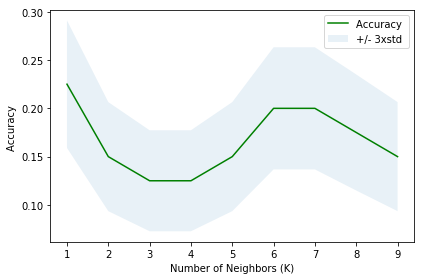

The best accuracy was with 0.225 with k= 1


In [46]:
# Split training data to test for best K
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 4)
print ('Train set:', x_train.shape,  y_train.shape)
print ('Test set:', x_test.shape,  y_test.shape)

# Find the best value for K
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    # Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(x_train,y_train)
    yhat = neigh.predict(x_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)
    
    std_acc[n-1] = np.std(yhat == y_test)/np.sqrt(yhat.shape[0])

mean_acc

# Plot to find Best K
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

Accuracy is still bad with KNN - try using Foursquare data to find other characteristics of neighborhoods

In [55]:
# Create dataset of venues excluding groceries and stores included in grocery category
NYC_no_groc = NYC_grouped.drop(columns = ['Grocery Store', 'Supermarket', 'Farmers Market', 'Fruit & Vegetable Store', 'Organic Grocery', 'Health Food Store', 'Deli / Bodega'])

# Create a function to sort most common venues by descending
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

# Create a dataframe with the top 10 venues for each neighborhood
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
NYC_venues_sorted = pd.DataFrame(columns = columns)
NYC_venues_sorted['Neighborhood'] = NYC_no_groc['Neighborhood']

for ind in np.arange(NYC_no_groc.shape[0]):
    NYC_venues_sorted.iloc[ind, 1:] = return_most_common_venues(NYC_no_groc.iloc[ind, :], num_top_venues)

NYC_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Martial Arts Dojo,Bus Station,Chinese Restaurant,Electronics Store,Bakery,Fast Food Restaurant,Pharmacy,Donut Shop,Discount Store
1,Annadale,Pizza Place,Cosmetics Shop,American Restaurant,Train Station,Diner,Pharmacy,Dance Studio,Restaurant,Park,Food
2,Arden Heights,Pharmacy,Coffee Shop,Bus Stop,Pizza Place,Women's Store,Fast Food Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space
3,Arlington,Bus Stop,Playground,Boat or Ferry,Intersection,Home Service,American Restaurant,Field,Fast Food Restaurant,Farm,Women's Store
4,Arrochar,Italian Restaurant,Bus Stop,Hotel,Food Truck,Bagel Shop,Middle Eastern Restaurant,Sandwich Place,Outdoors & Recreation,Athletics & Sports,Pizza Place


##### Use KMeans to group the data

Determine best number of K

Train set: (210, 422) (210,)
Test set: (91, 422) (91,)


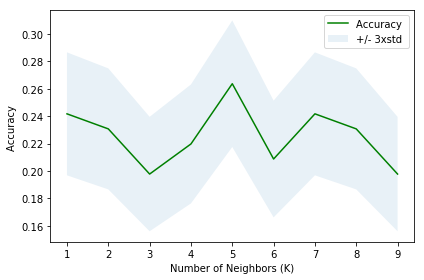

The best accuracy was with 0.26373626373626374 with k= 5


In [60]:
x = NYC_no_groc.drop('Neighborhood', 1)
y = NYC_grouped['Groceries']

# Split training data to test for best K
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 4)
print ('Train set:', x_train.shape,  y_train.shape)
print ('Test set:', x_test.shape,  y_test.shape)

# Find the best value for K
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    # Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(x_train,y_train)
    yhat = neigh.predict(x_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)
    
    std_acc[n-1] = np.std(yhat == y_test)/np.sqrt(yhat.shape[0])

mean_acc

# Plot to find Best K
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

###### KNN is not very accuate - Use KMeans to form clusters 

Determine ideal number of clusters

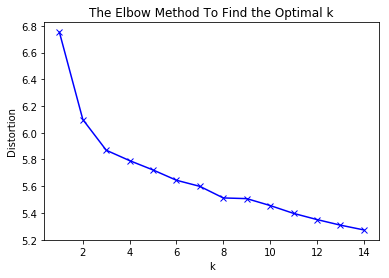

In [61]:
# Determine how many clusters to use for k-means
NYC_comb_groc = NYC_grouped.drop(columns = ['Supermarket', 'Farmers Market', 'Fruit & Vegetable Store', 'Organic Grocery', 'Health Food Store', 'Deli / Bodega'])

NYC_grouped_clustering = NYC_comb_groc.drop('Neighborhood', 1)
distortions = []
K = range(1,15)

for k in K:
    kmeanModel = KMeans(n_clusters = k, random_state = 0).fit(NYC_grouped_clustering)
    kmeanModel.fit(NYC_grouped_clustering)
    distortions.append(sum(np.min(cdist(NYC_grouped_clustering, 
                                        kmeanModel.cluster_centers_, 
                                        'euclidean'), axis = 1)) / NYC_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method To Find the Optimal k')
plt.show()

Use 8 clusters for the data

In [62]:
# set number of clusters based on elbow method - it looks like 8 is best for this data
kclusters = 8

# run k-means clustering
kmeans = KMeans(n_clusters = kclusters, random_state = 0).fit(NYC_grouped_clustering)

# Check clusters
kmeans.labels_

array([5, 0, 6, 6, 0, 6, 4, 6, 6, 0, 1, 1, 0, 0, 4, 6, 5, 0, 6, 6, 6, 0,
       7, 5, 6, 6, 6, 3, 0, 6, 6, 0, 6, 0, 6, 4, 6, 6, 5, 4, 6, 6, 6, 3,
       7, 6, 0, 6, 0, 3, 4, 0, 0, 3, 5, 6, 5, 3, 3, 0, 3, 5, 6, 5, 0, 6,
       0, 6, 5, 0, 5, 0, 0, 3, 1, 6, 6, 6, 5, 6, 0, 3, 4, 0, 6, 6, 0, 6,
       6, 6, 5, 6, 6, 5, 6, 3, 0, 3, 6, 6, 5, 4, 5, 5, 1, 4, 6, 0, 1, 0,
       6, 0, 6, 1, 3, 6, 0, 0, 0, 0, 3, 6, 7, 6, 3, 6, 6, 5, 6, 0, 6, 6,
       5, 0, 1, 6, 1, 6, 5, 4, 0, 6, 0, 5, 5, 0, 4, 5, 6, 0, 3, 6, 3, 0,
       3, 5, 3, 0, 1, 6, 6, 6, 0, 1, 1, 6, 0, 6, 6, 5, 5, 6, 6, 3, 2, 0,
       5, 6, 1, 0, 5, 0, 0, 5, 0, 2, 6, 6, 0, 6, 0, 0, 3, 5, 0, 3, 5, 0,
       6, 5, 6, 0, 6, 0, 6, 6, 3, 5, 0, 0, 0, 0, 6, 6, 6, 6, 6, 3, 5, 5,
       6, 0, 6, 6, 0, 1, 5, 6, 0, 6, 6, 5, 6, 6, 0, 0, 0, 0, 6, 0, 6, 0,
       6, 0, 6, 0, 0, 6, 7, 6, 0, 6, 6, 6, 3, 6, 6, 6, 1, 0, 6, 0, 6, 5,
       4, 5, 3, 6, 6, 0, 6, 6, 1, 1, 1, 0, 0, 7, 1, 6, 5, 6, 6, 4, 6, 0,
       0, 7, 0, 6, 6, 6, 1, 6, 5, 0, 0, 5, 0, 4, 3]

In [63]:
# add clustering labels
NYC_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
NYC_merged = NYC_merged.join(NYC_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

NYC_merged.head() 

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,1,6,Pharmacy,Gas Station,Donut Shop,Sandwich Place,Dessert Shop,Ice Cream Shop,Laundromat,Food,Fish Market,Farm
1,Bronx,Co-op City,40.874294,-73.829939,1,0,Bus Station,Fast Food Restaurant,Baseball Field,Pizza Place,Salon / Barbershop,Fried Chicken Joint,Park,Bagel Shop,Basketball Court,Restaurant
2,Bronx,Eastchester,40.887556,-73.827806,2,0,Bus Station,Caribbean Restaurant,Diner,Cosmetics Shop,Pizza Place,Metro Station,Bakery,Seafood Restaurant,Automotive Shop,Fast Food Restaurant
3,Bronx,Fieldston,40.895437,-73.905643,0,6,Plaza,River,Bus Station,Business Service,Film Studio,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Factory
4,Bronx,Riverdale,40.890834,-73.912585,0,6,Park,Bus Station,Bank,Baseball Field,Gym,Plaza,Playground,Field,Entertainment Service,Ethiopian Restaurant


Map the Clustered Neighborhoods

In [65]:
# Create an empty map of NYC
NYC_map = folium.Map(location = [latitude, longitude], 
                    zoom_start = 10)

# generate choropleth map 
NYC_map.choropleth(geo_data = NTA,
    data = NYC_merged,
    columns = ['Neighborhood', 'Cluster Labels'],
    key_on = 'feature.properties.ntaname',
    fill_color = 'YlOrRd', 
    fill_opacity = 0.7, 
    line_opacity = 0.2,
    legend_name = 'New York City Neighborhood Clusters'
)


NYC_map

Look at each cluster and determine similar features within clusters

In [72]:
Cluster_0 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 0]
Cluster_1 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 1]
Cluster_2 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 2]
Cluster_3 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 3]
Cluster_4 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 4]
Cluster_5 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 5]
Cluster_6 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 6]
Cluster_7 = NYC_merged.loc[NYC_merged['Cluster Labels'] == 7]

In [73]:
Cluster_0.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,82,82,82.000000,82.000000,82.000000,82.0,82,82,82,82,82,82,82,82,82,82
unique,5,81,NaN,NaN,NaN,NaN,30,38,45,44,52,52,55,53,55,55
top,Bronx,Bay Terrace,NaN,NaN,NaN,NaN,Pizza Place,Donut Shop,Pharmacy,Pharmacy,Pizza Place,Mobile Phone Shop,Sandwich Place,Bagel Shop,Bagel Shop,Pizza Place
freq,22,2,NaN,NaN,NaN,NaN,18,9,8,7,8,5,8,5,4,6
mean,NaN,NaN,40.704411,-73.932294,1.817073,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.108916,0.128729,1.019901,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.524699,-74.232158,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.610623,-73.996689,1.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.688559,-73.903924,2.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.819534,-73.838987,2.750000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
Cluster_1.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,19,19,19.000000,19.000000,19.000000,19.0,19,19,19,19,19,19,19,19,19,19
unique,4,19,NaN,NaN,NaN,NaN,10,12,13,15,15,16,15,18,14,17
top,Manhattan,Red Hook,NaN,NaN,NaN,NaN,Park,Italian Restaurant,Coffee Shop,Coffee Shop,Italian Restaurant,Ice Cream Shop,Playground,Gym,Mexican Restaurant,Scenic Lookout
freq,10,1,NaN,NaN,NaN,NaN,4,4,3,2,3,3,2,2,3,2
mean,NaN,NaN,40.725436,-73.989286,2.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.053283,0.031240,1.699673,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.625801,-74.079353,0.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.695852,-74.005397,1.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.717807,-73.980890,2.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.754350,-73.965997,3.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
Cluster_2.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,3,3,3.000000,3.000000,3.000000,3.0,3,3,3,3,3,3,3,3,3,3
unique,2,2,NaN,NaN,NaN,NaN,1,1,2,2,2,2,2,2,2,2
top,Manhattan,Murray Hill,NaN,NaN,NaN,NaN,Korean Restaurant,Hotel,Sandwich Place,Coffee Shop,Japanese Restaurant,Pizza Place,Bar,Mediterranean Restaurant,Gym / Fitness Center,Chinese Restaurant
freq,2,2,NaN,NaN,NaN,NaN,3,3,2,2,2,2,2,2,2,2
mean,NaN,NaN,40.753646,-73.926603,4.333333,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.009076,0.098725,2.886751,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.748303,-73.988713,1.000000,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.748406,-73.983523,3.500000,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.748510,-73.978332,6.000000,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.756318,-73.895547,6.000000,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
Cluster_3.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,27,27,27.000000,27.000000,27.000000,27.0,27,27,27,27,27,27,27,27,27,27
unique,4,26,NaN,NaN,NaN,NaN,11,10,16,18,19,16,19,19,20,21
top,Manhattan,Chelsea,NaN,NaN,NaN,NaN,Coffee Shop,Coffee Shop,Cocktail Bar,Wine Shop,Café,Italian Restaurant,American Restaurant,Sandwich Place,Mexican Restaurant,Thai Restaurant
freq,16,2,NaN,NaN,NaN,NaN,10,10,3,3,4,6,3,3,3,3
mean,NaN,NaN,40.726639,-73.984090,2.814815,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.044889,0.045498,1.520046,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.594726,-74.189560,1.000000,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.700168,-73.993533,2.000000,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.727847,-73.981669,3.000000,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.756896,-73.958834,4.000000,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
Cluster_4.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,13,13,13.000000,13.000000,13.00000,13.0,13,13,13,13,13,13,13,13,13,13
unique,4,13,NaN,NaN,NaN,NaN,8,10,13,10,10,12,13,10,12,11
top,Queens,Brooklyn Heights,NaN,NaN,NaN,NaN,Bar,Bakery,Bank,Cocktail Bar,Donut Shop,Mexican Restaurant,Donut Shop,Spanish Restaurant,Bank,Gourmet Shop
freq,5,1,NaN,NaN,NaN,NaN,5,3,1,2,2,2,1,3,2,2
mean,NaN,NaN,40.754306,-73.924083,6.00000,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.074864,0.063096,2.44949,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.614768,-74.031979,3.00000,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.708492,-73.938858,4.00000,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.746349,-73.918193,5.00000,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.768509,-73.901842,8.00000,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
Cluster_5.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,42,42,42.000000,42.000000,42.000000,42.0,42,42,42,42,42,42,42,42,42,42
unique,5,41,NaN,NaN,NaN,NaN,20,24,26,26,30,33,31,36,31,31
top,Bronx,Sunnyside,NaN,NaN,NaN,NaN,Pizza Place,Pizza Place,Bakery,Italian Restaurant,Sandwich Place,Latin American Restaurant,Pharmacy,Pharmacy,Coffee Shop,Donut Shop
freq,13,2,NaN,NaN,NaN,NaN,13,9,7,4,6,3,5,3,4,4
mean,NaN,NaN,40.736052,-73.918873,3.928571,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.100133,0.088990,1.454897,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.542231,-74.164331,1.000000,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.645579,-73.958113,3.000000,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.727201,-73.911245,4.000000,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.836038,-73.858200,5.000000,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
Cluster_6.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,113,113,113.000000,113.000000,113.000000,113.0,113,113,113,113,113,113,113,113,113,113
unique,5,113,NaN,NaN,NaN,NaN,58,76,66,74,69,62,56,54,53,45
top,Queens,Marine Park,NaN,NaN,NaN,NaN,Italian Restaurant,Pizza Place,Women's Store,Caribbean Restaurant,Women's Store,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Factory
freq,39,1,NaN,NaN,NaN,NaN,9,6,8,5,9,16,20,21,20,21
mean,NaN,NaN,40.666690,-73.949705,0.707965,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.097283,0.148555,0.786963,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.505334,-74.246569,0.000000,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.597069,-74.096290,0.000000,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.635630,-73.913221,1.000000,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.731000,-73.824099,1.000000,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
Cluster_7.describe(include = 'all')

,Borough,Neighborhood,Latitude,Longitude,Groceries,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
count,6,6,6.000000,6.000000,6.000000,6.0,6,6,6,6,6,6,6,6,6,6
unique,3,6,NaN,NaN,NaN,NaN,1,5,5,6,6,6,4,6,6,6
top,Manhattan,Soho,NaN,NaN,NaN,NaN,Italian Restaurant,Coffee Shop,Bakery,Cocktail Bar,Yoga Studio,Wine Shop,Bar,Cocktail Bar,Bakery,Sushi Restaurant
freq,4,1,NaN,NaN,NaN,NaN,6,2,2,1,1,1,2,1,1,1
mean,NaN,NaN,40.749501,-73.975061,3.000000,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.060888,0.045471,3.162278,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,40.680540,-74.006180,1.000000,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,40.723371,-74.000471,1.000000,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.730683,-73.997284,1.500000,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,40.765337,-73.969044,3.500000,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
